# Проект: промышленность

Чтобы оптимизировать производственные расходы, металлургический комбинат ООО «Так закаляем сталь» решил уменьшить потребление электроэнергии на этапе обработки стали. Необходимо построить модель, которая предскажет температуру стали.

## Описание этапа обработки стали

Сталь обрабатывают в металлическом ковше вместимостью около 100 тонн. Чтобы ковш выдерживал высокие температуры, изнутри его облицовывают огнеупорным кирпичом. Расплавленную сталь заливают в ковш и подогревают до нужной температуры графитовыми электродами. Они установлены в крышке ковша. 

Из сплава выводится сера (десульфурация), добавлением примесей корректируется химический состав и отбираются пробы. Сталь легируют — изменяют её состав — подавая куски сплава из бункера для сыпучих материалов или проволоку через специальный трайб-аппарат (англ. tribe, «масса»).

Перед тем как первый раз ввести легирующие добавки, измеряют температуру стали и производят её химический анализ. Потом температуру на несколько минут повышают, добавляют легирующие материалы и продувают сплав инертным газом. Затем его перемешивают и снова проводят измерения. Такой цикл повторяется до достижения целевого химического состава и оптимальной температуры плавки.

Тогда расплавленная сталь отправляется на доводку металла или поступает в машину непрерывной разливки. Оттуда готовый продукт выходит в виде заготовок-слябов (англ. slab, «плита»).

## Цель

Для уменьшения потребления электроэнергии на этапе обработки стали необходимо построить модель, которая предскажет температуру стали.

# Исследовательский анализ данных

In [1]:
# Устанавилваем дополнительные модули для анализа
!pip install pandas_profiling

In [2]:
!pip install dill

In [3]:
# Импортируем модули, необходимые для решения поставленной задачи
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import ydata_profiling
from sklearn.model_selection import train_test_split
import lightgbm as lgb
from sklearn.metrics import mean_absolute_error, r2_score
from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
import dill as pickle
from catboost import CatBoostRegressor
from sklearn.dummy import DummyRegressor

In [4]:
# Считываем данные из файлов:

# данные об электродах
try:
    data_arc = pd.read_csv('data_arc_new.csv')
except:
    data_arc = pd.read_csv('/datasets/data_arc_new.csv')

# данные о подаче сыпучих материалов (объём)
try:
    data_bulk = pd.read_csv('data_bulk_new.csv')
except:
    data_bulk = pd.read_csv('/datasets/data_bulk_new.csv')

# данные о подаче сыпучих материалов (время)
try:
    data_bulk_time = pd.read_csv('data_bulk_time_new.csv')
except:
    data_bulk_time = pd.read_csv('/datasets/data_bulk_time_new.csv')

# данные о продувке сплава газом
try:
    data_gas = pd.read_csv('data_gas_new.csv')
except:
    data_gas = pd.read_csv('/datasets/data_gas_new.csv')

# результаты измерения температуры
try:
    data_temp = pd.read_csv('data_temp_new.csv')
except:
    data_temp = pd.read_csv('/datasets/data_temp_new.csv')

# данные о проволочных материалах (объём)
try:
    data_wire = pd.read_csv('data_wire_new.csv')
except:
    data_wire = pd.read_csv('/datasets/data_wire_new.csv')

# данные о проволочных материалах (время)
try:
    data_wire_time = pd.read_csv('data_wire_time_new.csv')
except:
    data_wire_time = pd.read_csv('/datasets/data_wire_time_new.csv')

In [5]:
ydata_profiling.ProfileReport(data_arc)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Датасет с информацией об электродах содержит 4 переменные (не считая `key`) и 14876 наблюдений. Дубликаты и пропуски в датасете отсутствуют. Переменные, характеризующие активную и реактивную мощности, имеют тесно взаимосвязаны, что может быть объяснено физическим смыслом данных величин (активная мощность, называемая также полезной мощностью, преобразуется в тепловую, механическую или световую энергию при совершении работы в потребителях, реактивная мощность не играет активной роли в процессе использования мощности для подачи энергии в нагрузку). Переменная, характеризующая реактивную мощность, содержит выбросы.

In [6]:
ydata_profiling.ProfileReport(data_bulk)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Датасет с информацией об объеме подачи сыпучих материалов содержит 15 переменных (не считая `key`) и 3129 наблюдений. Дубликаты в датасете отсутствуют. В каждой переменной наблюдаются пропуски. Это может быть связано с тем, что наблюдаемая сыпучая смесь не использовалась на данном этапе обработки сырья, что необходимо уточнить у заказчика. Часть показателей имеют высокий коэффициент парной корреляции, что может быть объяснено химическими свойствами исходного сырья и особенностями его обработки. Переменные содержат выбросы, что также может быть связано с качеством исходного сырья.

In [7]:
ydata_profiling.ProfileReport(data_bulk_time)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Датасет с информацией о времени подачи сыпучих материалов (не считая `key`) содержит 15 переменных (не считая `key`) и 3129 наблюдений, характеризующих время подачи сыпучих материалов в объеме, указанном в датасете `data_bulk`.

In [8]:
ydata_profiling.ProfileReport(data_gas) 

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Датасет с информацией о продувке сплава газом содержит 1 переменную (не считая `key`) и 3239 наблюдений. В переменной дубликаты и отсутствуют пропущенные значения. Переменная содержит выбросы, что может быть связано с качеством исходного сырья. Сможем оценить, так ли это, после объединения исследуемых датасетов в одну общую таблицу, которая поможет оценить "совпадение" выбросов различных переменных. 

In [9]:
ydata_profiling.ProfileReport(data_temp)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Датасет с информацией о результатах измерения температуры содержит 2 переменные (не считая `key`) и 18092 наблюдения. В датасетет отсутствуют дубликаты. Переменная с датой замера температуры не содержит пропусков. В переменной, содержащей значения температуры, пропущено около 19% значений. Необходимо уточнить у заказчика, с чем это может быть связано.

In [10]:
ydata_profiling.ProfileReport(data_wire)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Датасет с информацией об объеме подачи проволочных материалах (объём) содержит 9 переменных (не считая `key`) и 3081 наблюдение. В датасете отсутсвуют дубликаты. В каждой переменной наблюдаются пропуски. Это может быть связано с тем, что наблюдаемый проволочный материал не использовался на данном этапе обработки сырья, что необходимо уточнить у заказчика. Часть показателей имеют высокий коэффициент парной корреляции, что может быть объяснено химическими свойствами исходного сырья и особенностями его обработки. Переменные содержат выбросы, что также может быть связано с качеством исходного сырья.

In [11]:
ydata_profiling.ProfileReport(data_wire_time)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Датасет с информацией о времени подачи проволочных материалах (объём) содержит 9 переменных (не считая `key`) и 3081 наблюдение, характеризующее время подачи проволочных материалах в объеме, указанном в датасете `data_wire`.

Заказчик передал нам информацию об обработке партий стали для анализа этого процесса. Конечная цель - уменьшение потребления электроэнергии на этапе обработки стали. Для этого нам необходимо построить модель, которая предскажет температуру по итогам обработки. 

В рамках проведенного исследовательского анализа данных мы рассмотрели переменные, характеризующие температуру стали на каждом этапе обработки, а также по ее завершении, информацию о времени и объеме подачи сыпучих и проволочных материалов, информацию о продувке газом. Мы оценили парную корреляцию признаков в рамках каждого датасета. Сильная корреляция между активной и реактивной мощностями может негативно повлиять на качество модели. Мы обнаружили переменные с пропущенными значениями, а также с выбросами. Для улучшения качества моделей, мы оценим значимость переменных (по согласованию с заказчиком удалим переменные с долей пропусков больше 0.8), а также заполним пропущенные значения (для материалов - нулями, согласовано с заказчиком, отсутствие информации говорит об отсутствии подачи материала). Партии с одним замером температуры не будут учитываться при построении модели, так как смоделировать процесс для них не представляется возможным. Партия стали, при обработке которой зафиксирована отрицательная реактивная мощность, не будет учитываться при построении модели (согласовано с заказчиком).

Для решения поставленной задачи необходимо:
 - провести предобработку данных. На этом этапе объединим все значимые переменные в общий датасет, проанализируем его и обработаем пропущенные значения, а также выбросы. Примем решение о создании дополнительных переменных на основании имеющихся. 
 - Сформировать целевую и объясняющие переменные. Мы узнаем у заказчика, есть ли тестовая выборка. В случае ее отсутствия разделим данные на тренировочную и тестовую выборки (выделять валидационную не будем, так как решим задачу с применением кросс0валидации). Выберем модели для анализа. 
 - Проанализировать качество выбранных моделей. Для каждой используемой модели рассчитаем значение целевой метрики, выберем лучшую модель. 
 - Протестировать лучшую модель. Определим, достигнуто ли пороговое значение целевой метрики. 
 - Проанализировать полученные результаты. Дадим интерпретацию полученных результатов, рекомендации заказчику по итогам исследования.
 - Подготовить отчет для заказчика.
 
Заказчик ответил на возникшие вопросы. Дополнительных вопросов нет.

#  Предварительная обработка данных

In [12]:
# Добавляем переменную, характеризующую время нагрева дугой
data_arc['time'] = data_arc['Конец нагрева дугой'].astype('datetime64[ns]') - \
                   data_arc['Начало нагрева дугой'].astype('datetime64[ns]')
data_arc['time'] = data_arc['time'].dt.total_seconds()

# Агрегируем данные по ключу
data_arc = data_arc.groupby(['key']).agg({'time': 'sum',
                                          'Активная мощность' : 'sum', 
                                          'Реактивная мощность': ['sum', 'min']}).reset_index()

# Переименовываем столбцы в соответствии с правилами "хорошего тона"
data_arc.columns = ['key', 'time', 'active_power', 'reactive_power', 'reactive_power_min']

# Выводим первые 5 строк полученного датасета
data_arc.head(5)

,key,time,active_power,reactive_power,reactive_power_min
0,1,1098.0,3.036730,2.142821,0.211253
1,2,811.0,2.139408,1.453357,0.205527
2,3,655.0,4.063641,2.937457,0.272562
3,4,741.0,2.706489,2.056992,0.241781
4,5,869.0,2.252950,1.687991,0.279102


In [13]:
# Удаляем замеры партии, реактивная мощность в которой была меньше 0
# (согласовано с заказчиком)
data_arc.query('reactive_power_min > 0', inplace = True)

# Выводим первые 5 строк полученного датасета
data_arc.head(5)

,key,time,active_power,reactive_power,reactive_power_min
0,1,1098.0,3.036730,2.142821,0.211253
1,2,811.0,2.139408,1.453357,0.205527
2,3,655.0,4.063641,2.937457,0.272562
3,4,741.0,2.706489,2.056992,0.241781
4,5,869.0,2.252950,1.687991,0.279102


In [14]:
# Генерируем новые переменные
# Полная мощность
data_arc['full_power'] = (data_arc['active_power'] ** 2 + 
                           data_arc['reactive_power'] ** 2) ** 0.5

# Удаляем неинформативные переменные
data_arc = data_arc.drop(columns = ['reactive_power_min'])

# Выводим первые 5 строк полученного датасета
data_arc.head(5)

,key,time,active_power,reactive_power,full_power
0,1,1098.0,3.036730,2.142821,3.716640
1,2,811.0,2.139408,1.453357,2.586371
2,3,655.0,4.063641,2.937457,5.014163
3,4,741.0,2.706489,2.056992,3.399456
4,5,869.0,2.252950,1.687991,2.815155


In [15]:
# Добавляем переменную, характеризующую время между первым и последним замерами температуры
data_temp_time=data_temp.groupby('key')['Время замера'].agg(['first',
                                                             'last',
                                                             'count']).reset_index()

data_temp_time['time_volume'] = data_temp_time['last'].astype('datetime64[ns]') - \
                                data_temp_time['first'].astype('datetime64[ns]')
data_temp_time['time_volume'] = data_temp_time['time_volume'].dt.total_seconds()
data_temp_time.drop(columns = ['first', 'last', 'count'], inplace = True)

# Выводим первые 5 строк полученного датасета
data_temp_time.head(5)

,key,time_volume
0,1,1714.0
1,2,1265.0
2,3,1753.0
3,4,1220.0
4,5,1536.0


In [16]:
# Агрегируем данные по ключу в датасете с температурой
data_temp = data_temp.sort_values(
    by=['Время замера'], 
    ascending=True
).groupby(['key']).agg({'Температура': ['first', 
                                        'last', 
                                        'count']}).reset_index()

# Переименовываем столбцы в соответствии с правилами "хорошего тона"
data_temp.columns = ['key', 'temp_start', 'temp_finish', 'count']

# Удаляем партии, в которых был только один замер температуры
data_temp.query('count > 1', inplace = True)

#Удаляем партии, начальная температура в которых ниже 1500 градусов
data_temp.query('temp_start > 1500', inplace = True)

# Выводим первые 5 строк полученного датасета
data_temp.head(5)

,key,temp_start,temp_finish,count
0,1,1571.0,1613.0,6
1,2,1581.0,1602.0,5
2,3,1596.0,1599.0,6
3,4,1601.0,1625.0,5
4,5,1576.0,1602.0,5


In [17]:
# Генерируем новые переменные
# Количество итераций
data_temp['iteration_quantity'] = data_temp['count'] - 1

# Удаляем неинформативные признаки
data_temp.drop(columns = 'count', inplace = True)

# Выводим первые 5 строк полученного датасета
data_temp.head(5)


,key,temp_start,temp_finish,iteration_quantity
0,1,1571.0,1613.0,5
1,2,1581.0,1602.0,4
2,3,1596.0,1599.0,5
3,4,1601.0,1625.0,4
4,5,1576.0,1602.0,4


In [18]:
# Удаляем признаки с долей пропущенных значений более 0,85 как неинформативные
data_bulk = data_bulk[['key', 'Bulk 3', 'Bulk 4', 'Bulk 6', 'Bulk 12', 'Bulk 14', 'Bulk 15']]
data_wire = data_wire[['key', 'Wire 1', 'Wire 2']]

# Переименовываем столбцы в соответствии с правилами "хорошего тона"
data_bulk.columns = ['key', 'bulk_3', 'bulk_4', 'bulk_6', 'bulk_12', 'bulk_14', 'bulk_15']
data_wire.columns = ['key', 'wire_1', 'wire_2']

# Заполняем пропущенные значения 0 (согласовано с заказчиком)
data_wire = data_wire.fillna(0)
data_bulk = data_bulk.fillna(0)

In [19]:
# Переименовываем столбцы в соответствии с правилами "хорошего тона"
data_gas.columns = ['key', 'gas']

In [20]:
# Объединяем признаки в один датасет
data = data_temp.merge(data_arc, 'inner', on = 'key')
data = data.merge(data_gas, 'inner', on = 'key')
data = data.merge(data_bulk, 'inner', on = 'key')
data = data.merge(data_wire, 'inner', on = 'key')
data = data.merge(data_temp_time, 'inner', on = 'key')
# Создаем дополнительную переменную, характеризующую объем газа,
# затраченный на одну итерацию

# Выводим последние 5 строк полученного датасета
data.tail(5)

,key,temp_start,temp_finish,iteration_quantity,time,active_power,reactive_power,full_power,gas,bulk_3,bulk_4,bulk_6,bulk_12,bulk_14,bulk_15,wire_1,wire_2,time_volume
2319,2495,1570.0,1591.0,4,723.0,3.168133,2.210936,3.863328,7.125735,21.0,0.0,0.0,256.0,129.0,223.0,89.150879,0.00000,1380.0
2320,2496,1554.0,1591.0,6,940.0,4.174918,2.872031,5.067396,9.412616,0.0,63.0,0.0,256.0,129.0,226.0,114.179527,0.00000,1705.0
2321,2497,1571.0,1589.0,3,569.0,3.605239,2.452092,4.360104,6.271699,0.0,85.0,0.0,230.0,124.0,226.0,94.086723,9.04800,962.0
2322,2498,1591.0,1594.0,5,750.0,3.202310,2.239820,3.907887,14.953657,90.0,0.0,0.0,206.0,129.0,207.0,118.110717,0.00000,1520.0
2323,2499,1569.0,1603.0,4,883.0,1.737084,1.296836,2.167774,11.336151,47.0,0.0,0.0,233.0,126.0,227.0,110.160958,50.00528,1537.0


In [21]:
data

,key,temp_start,temp_finish,iteration_quantity,time,active_power,reactive_power,full_power,gas,bulk_3,bulk_4,bulk_6,bulk_12,bulk_14,bulk_15,wire_1,wire_2,time_volume
0,1,1571.0,1613.0,5,1098.0,3.036730,2.142821,3.716640,29.749986,0.0,43.0,0.0,206.0,150.0,154.0,60.059998,0.00000,1714.0
1,2,1581.0,1602.0,4,811.0,2.139408,1.453357,2.586371,12.555561,0.0,73.0,0.0,206.0,149.0,154.0,96.052315,0.00000,1265.0
2,3,1596.0,1599.0,5,655.0,4.063641,2.937457,5.014163,28.554793,0.0,34.0,0.0,205.0,152.0,153.0,91.160157,0.00000,1753.0
3,4,1601.0,1625.0,4,741.0,2.706489,2.056992,3.399456,18.841219,0.0,81.0,0.0,207.0,153.0,154.0,89.063515,0.00000,1220.0
4,5,1576.0,1602.0,4,869.0,2.252950,1.687991,2.815155,5.413692,0.0,78.0,0.0,203.0,151.0,152.0,89.238236,9.11456,1536.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2319,2495,1570.0,1591.0,4,723.0,3.168133,2.210936,3.863328,7.125735,21.0,0.0,0.0,256.0,129.0,223.0,89.150879,0.00000,1380.0
2320,2496,1554.0,1591.0,6,940.0,4.174918,2.872031,5.067396,9.412616,0.0,63.0,0.0,256.0,129.0,226.0,114.179527,0.00000,1705.0
2321,2497,1571.0,1589.0,3,569.0,3.605239,2.452092,4.360104,6.271699,0.0,85.0,0.0,230.0,124.0,226.0,94.086723,9.04800,962.0
2322,2498,1591.0,1594.0,5,750.0,3.202310,2.239820,3.907887,14.953657,90.0,0.0,0.0,206.0,129.0,207.0,118.110717,0.00000,1520.0


In [22]:
data.drop(columns = 'key', inplace = True)
data.reset_index()
# Выведем основную информацию о датасете
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2324 entries, 0 to 2323
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   temp_start          2324 non-null   float64
 1   temp_finish         2324 non-null   float64
 2   iteration_quantity  2324 non-null   int64  
 3   time                2324 non-null   float64
 4   active_power        2324 non-null   float64
 5   reactive_power      2324 non-null   float64
 6   full_power          2324 non-null   float64
 7   gas                 2324 non-null   float64
 8   bulk_3              2324 non-null   float64
 9   bulk_4              2324 non-null   float64
 10  bulk_6              2324 non-null   float64
 11  bulk_12             2324 non-null   float64
 12  bulk_14             2324 non-null   float64
 13  bulk_15             2324 non-null   float64
 14  wire_1              2324 non-null   float64
 15  wire_2              2324 non-null   float64
 16  time_v

В датасете осталось 2324 наблюдения, пропуски в переменных отсутствуют. 

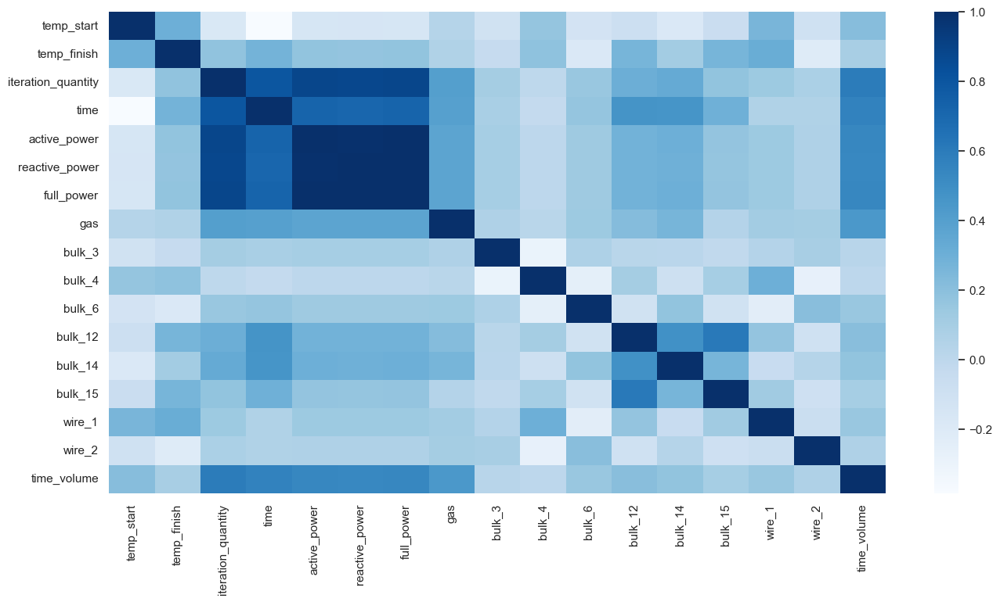

In [23]:
%matplotlib inline
# Определим размер графиков
sns.set(rc={"figure.figsize":(16, 8)})
# Визуализируем матрицу корреляции признаков
sns.heatmap(data.corr(), cmap="Blues");

Мы обнаружили достаточно сильную корреляцию между переменными, характеризующими время обработки одной партии и количеством итераций в рамках одного производственного цикла, что объясняется логикой процесса. Также достаточно сильная взаимосвязь наблюдается между объемом некоторых примесей. Считаем, что это не противоречит здравому смыслу - возможно, осуществление определенных химических реакций возможно только при их совместном использовании. Так как нами не будет использована модель линейной регресси, обрабатывать признаки с высоким коэффициентом корреляции во избежание мультиколлинеарности не требуется. 

In [24]:
# Выведем описательную статистику данных
data.describe().T

,count,mean,std,min,25%,50%,75%,max
temp_start,2324.0,1587.368761,23.627590,1519.000000,1571.000000,1587.000000,1603.000000,1660.000000
temp_finish,2324.0,1593.372633,11.207457,1541.000000,1587.000000,1593.000000,1598.000000,1653.000000
iteration_quantity,2324.0,4.696644,1.606210,1.000000,4.000000,5.000000,6.000000,16.000000
time,2324.0,808.196644,340.813828,57.000000,581.000000,778.000000,993.000000,4189.000000
active_power,2324.0,3.126327,1.220484,0.267676,2.295960,3.036517,3.834302,12.375636
reactive_power,2324.0,2.301280,0.903711,0.196228,1.671099,2.225900,2.829179,8.949049
full_power,2324.0,3.882991,1.516067,0.331897,2.842446,3.767364,4.767398,15.272257
gas,2324.0,11.378854,6.397008,0.008399,7.282534,10.100687,14.218487,77.995040
bulk_3,2324.0,47.317126,75.238050,0.000000,0.000000,0.000000,80.000000,454.000000
bulk_4,2324.0,37.347676,58.677890,0.000000,0.000000,0.000000,77.250000,281.000000


In [25]:
# Напишем функцию, выводяющую графики распределения данных
def graph_outlier(data, column):
    fig = plt.figure()
    ax_1 = fig.add_subplot(2, 1, 1)
    data[column].hist();
    plt.title(f'График распределения переменной {column}',
              size= 16, 
              weight= 100); 
    ax_2 = fig.add_subplot(2, 1, 2)
    data.boxplot(column, vert=False);   

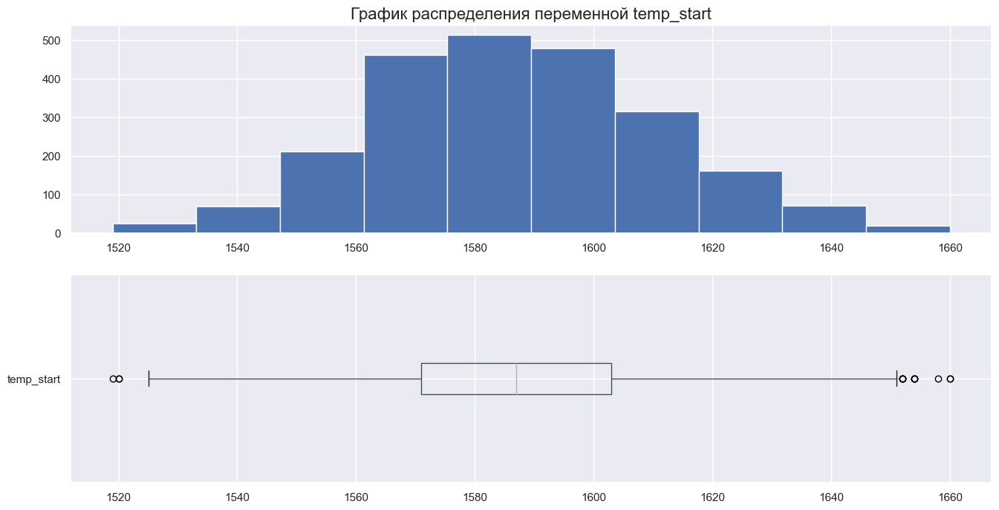

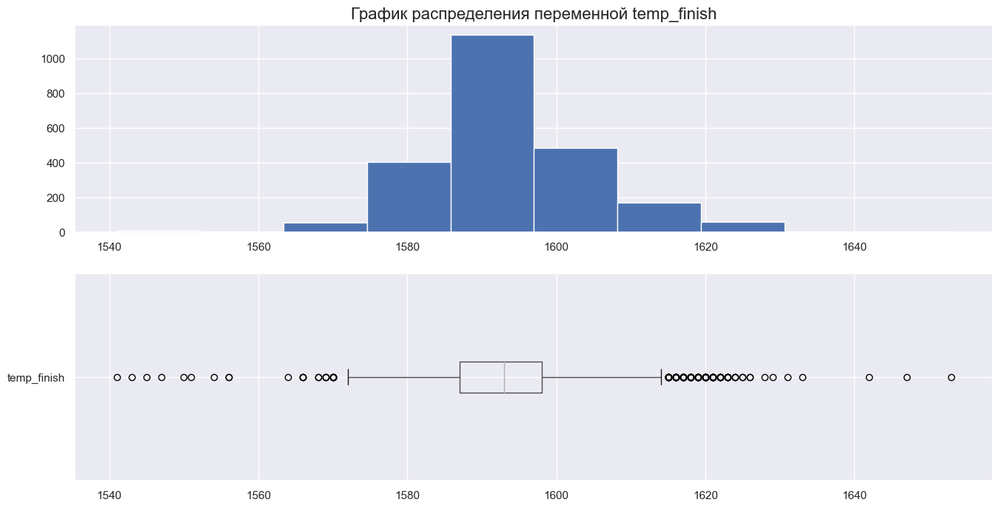

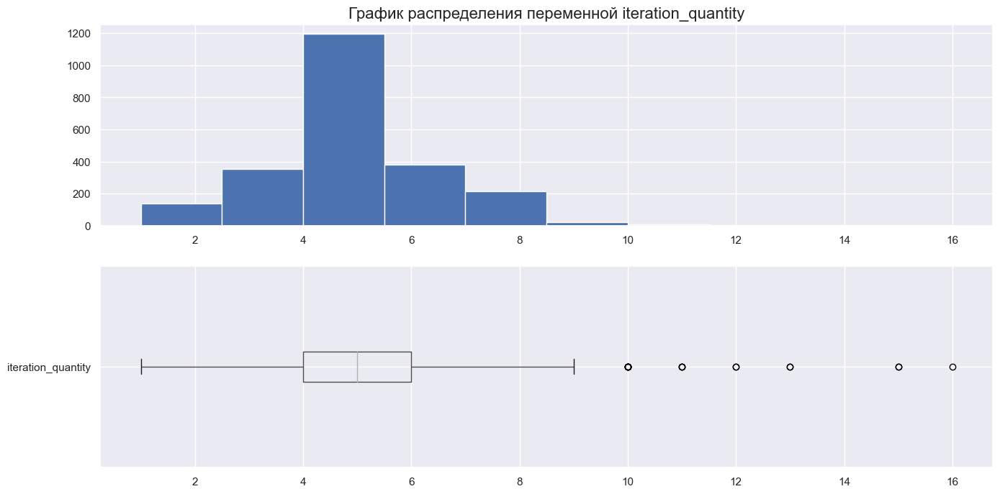

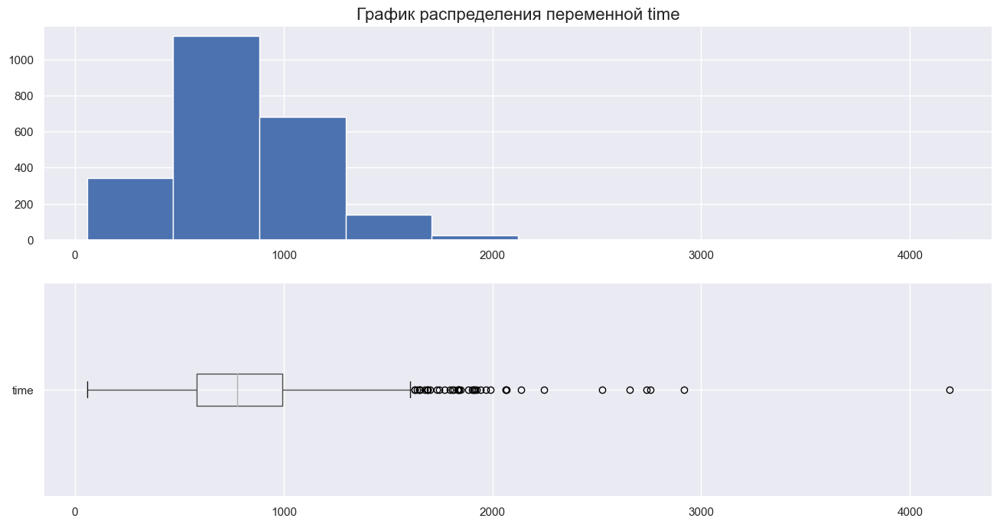

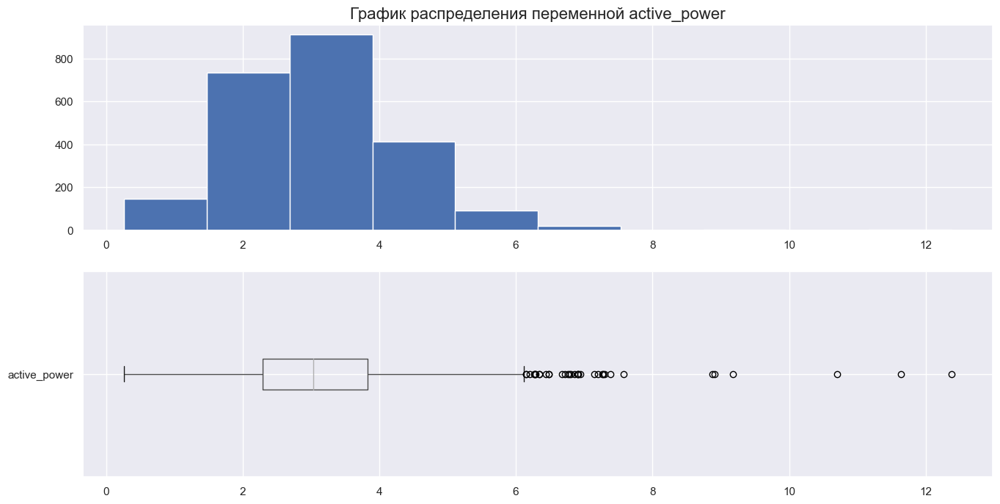

...

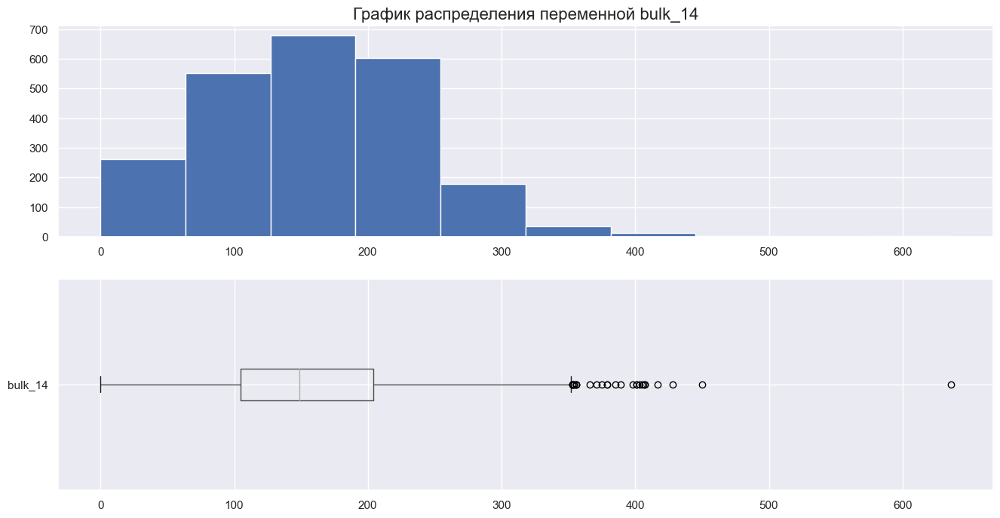

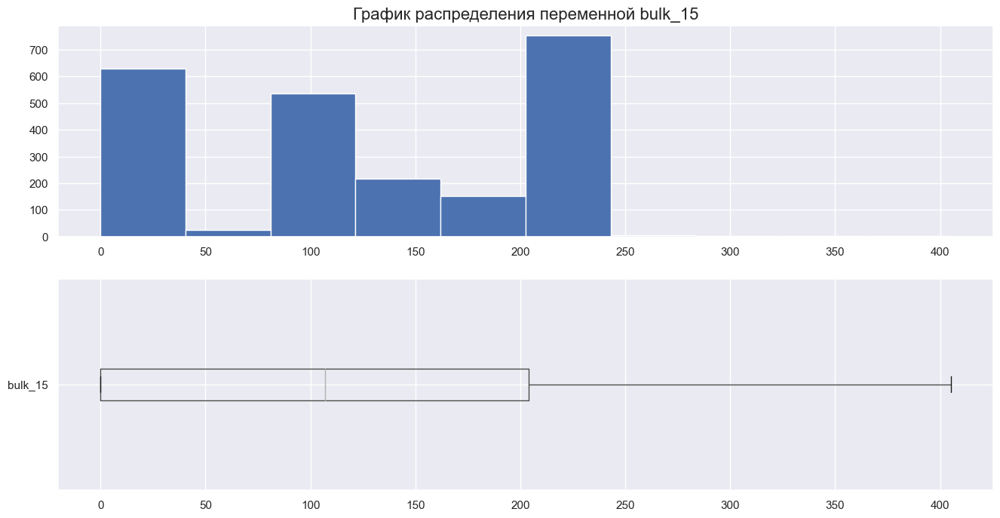

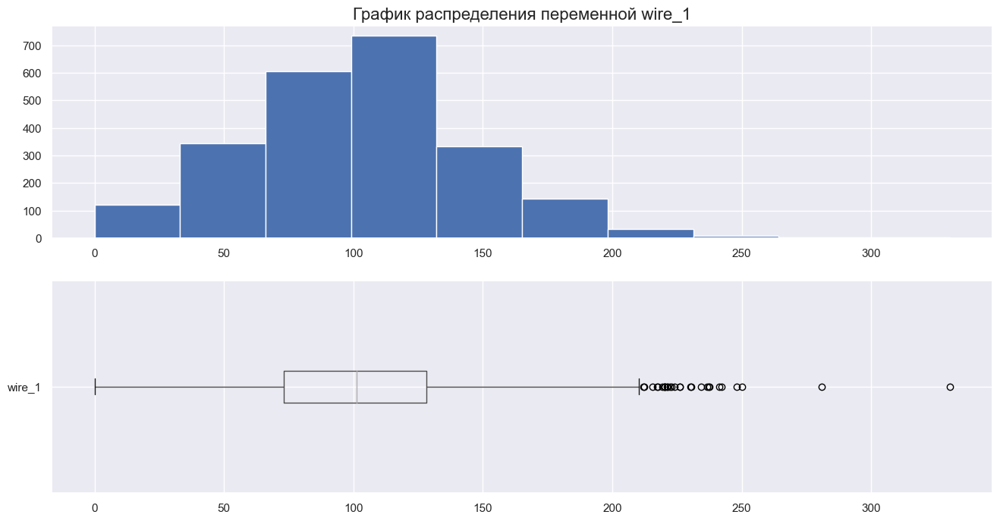

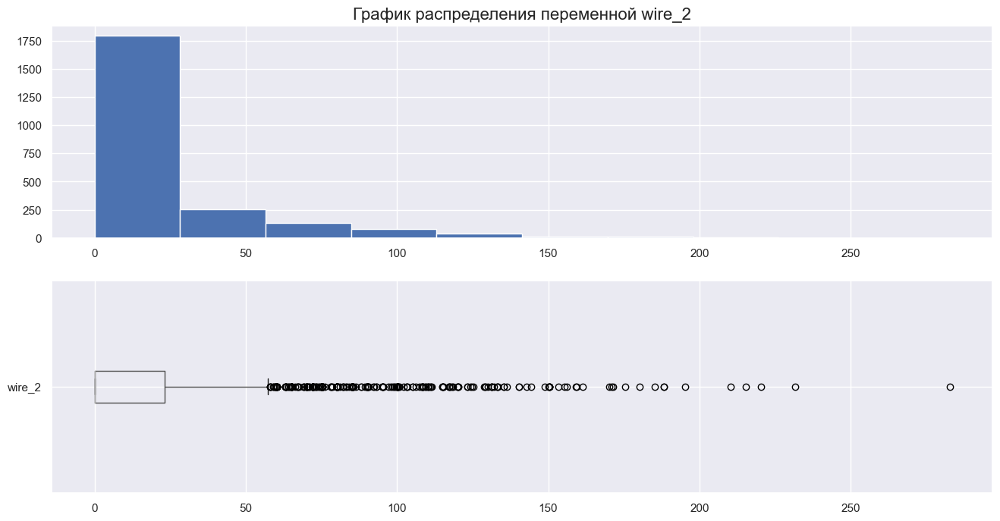

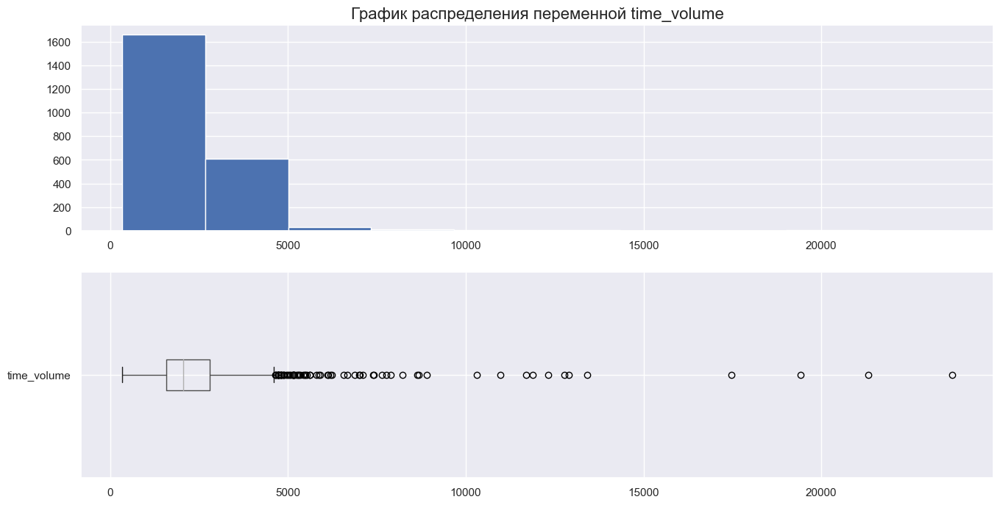

In [26]:
# Строим графики распределения данных
plt.rcParams.update({'figure.max_open_warning': 0})
for column in data.columns:
    graph_outlier(data, column)

## Подготовка выборок

In [27]:
# Делим датасет на тренировочную и тестовую выборки
RANDOM_STATE = 280823
data_train, data_test = train_test_split(data, test_size=0.25, random_state=RANDOM_STATE)

# Выводим размер тренировочной выборки
data_train.shape[0]

1743

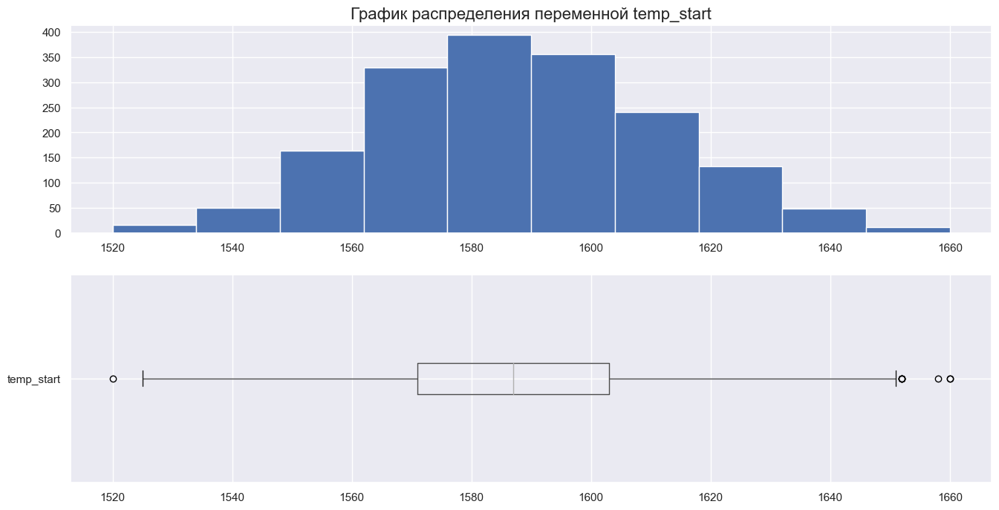

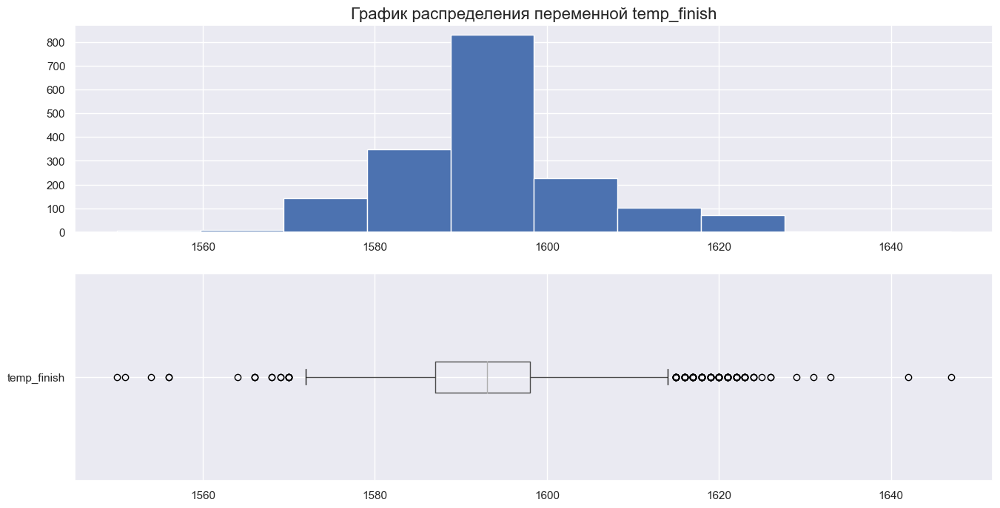

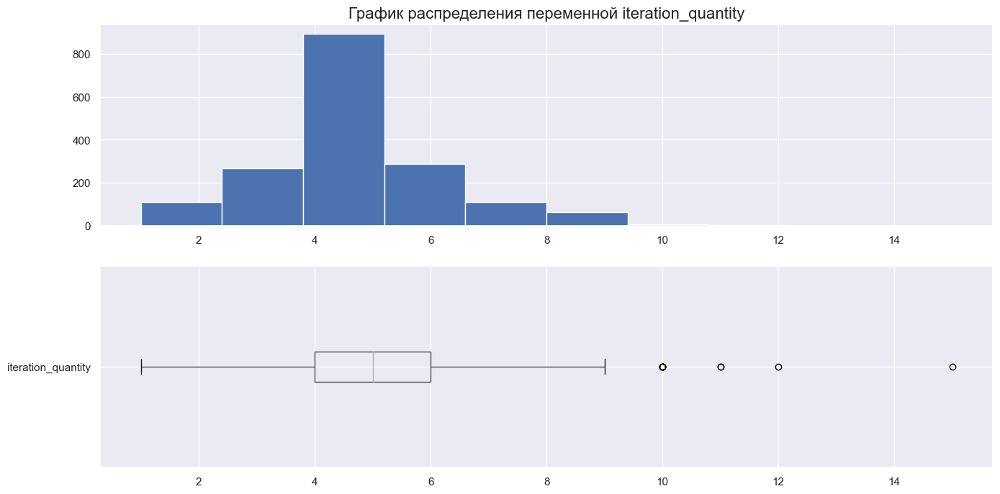

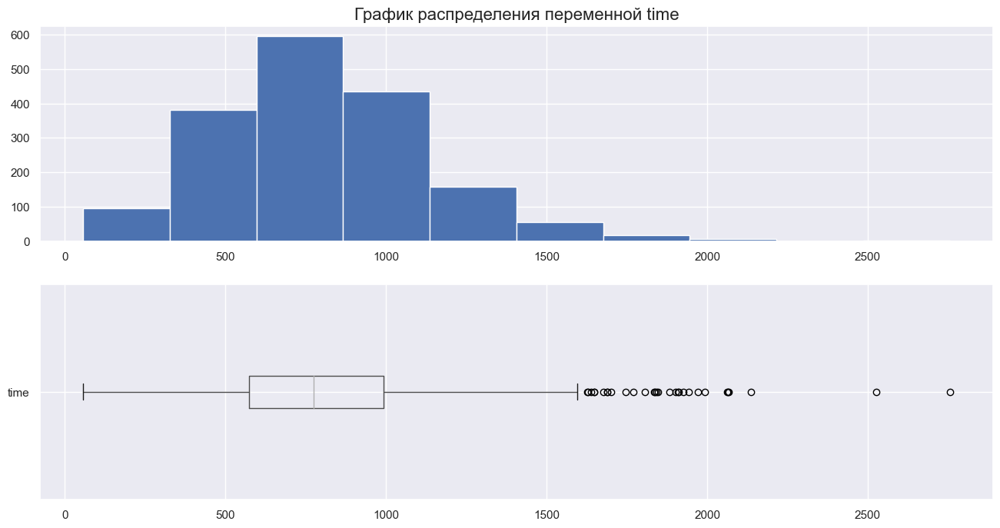

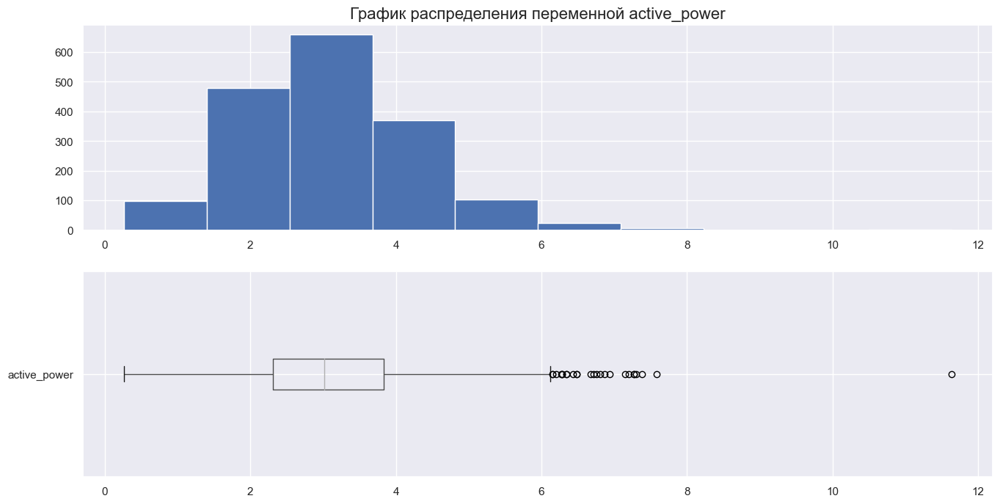

...

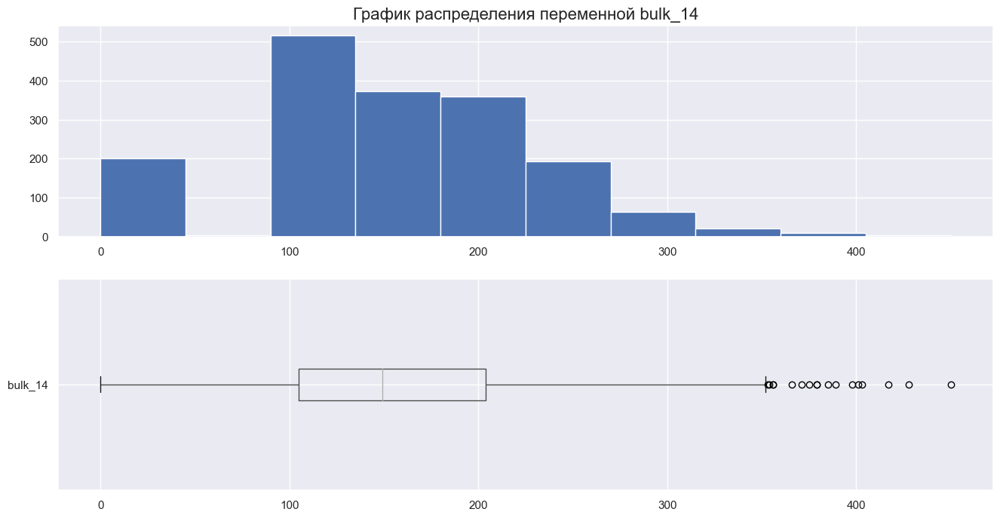

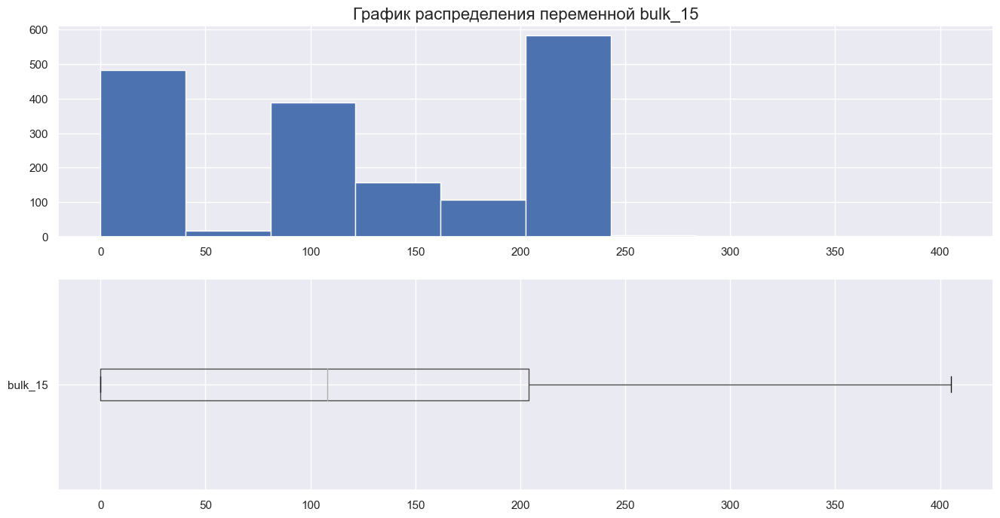

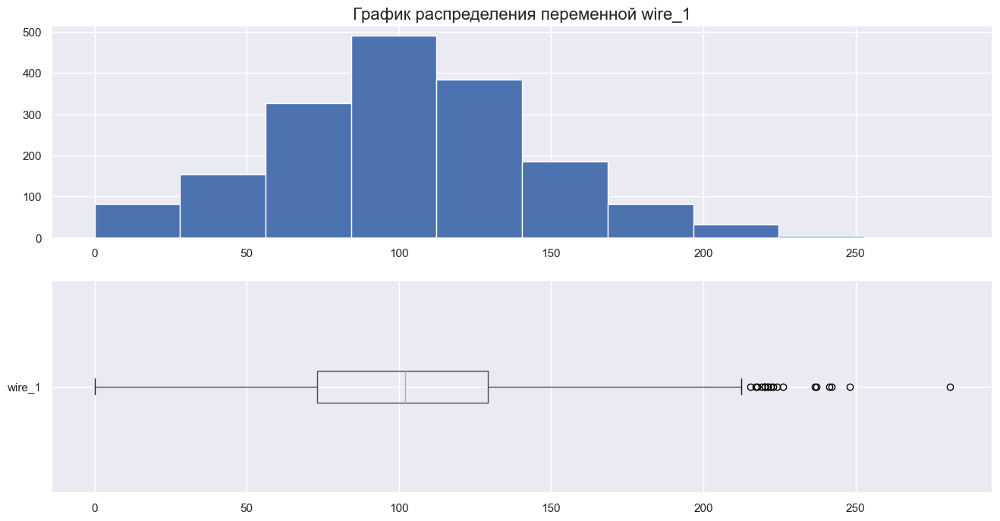

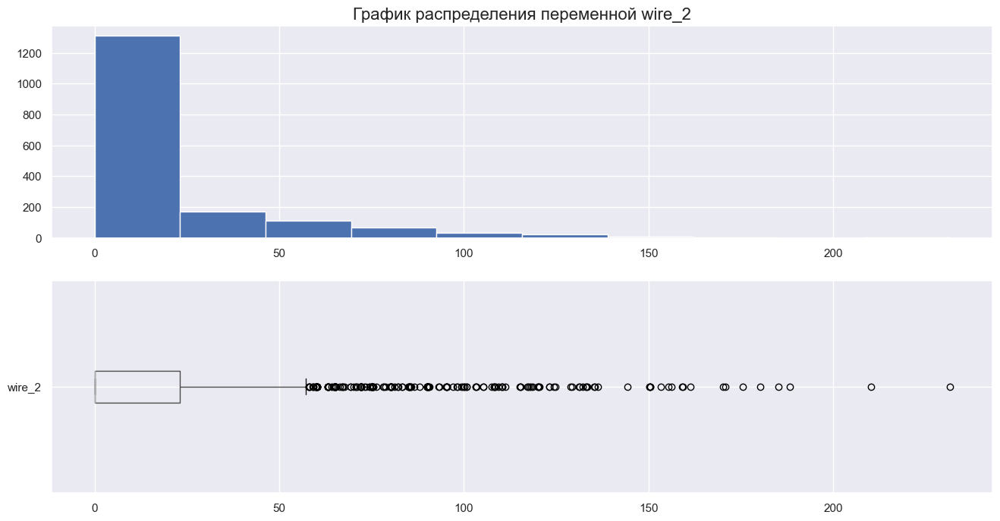

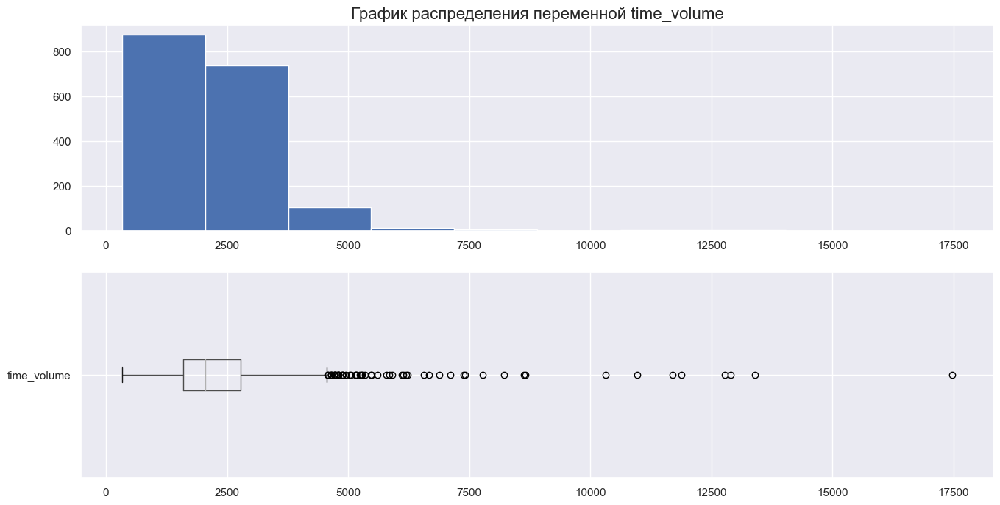

In [28]:
# Строим графики распределения данных
for column in data_train.columns:
    graph_outlier(data_train, column)

In [29]:
# Задаем объясняемые и объясняющие переменные
# Для тренировочной выборки
target_train = data_train['temp_finish']
features_train = data_train.drop(columns = ['temp_finish', 'active_power', 'reactive_power'])
# Для тестовой выборки
target_test = data_test['temp_finish']
features_test = data_test.drop(columns = ['temp_finish', 'active_power', 'reactive_power'])

In [30]:
"""from sklearn.preprocessing import StandardScaler
#обучение инструмента масштабирования
scaler=StandardScaler()
scaler.fit(features_train)

#масштабирование численных признаков (у нас - всех)
features_train=scaler.transform(features_train)
features_test=scaler.transform(features_test)"""

'from sklearn.preprocessing import StandardScaler\n#обучение инструмента масштабирования\nscaler=StandardScaler()\nscaler.fit(features_train)\n\n#масштабирование численных признаков (у нас - всех)\nfeatures_train=scaler.transform(features_train)\nfeatures_test=scaler.transform(features_test)'

# Обучение моделей

## Модель случайного леса

In [31]:
%%time
# Определяем модель
model = RandomForestRegressor(random_state = RANDOM_STATE)

# Задаем параметры для GridSearchCV
params = {'max_depth':range(1, 10),
          'n_estimators': range(100, 301, 50),
          'min_samples_leaf': range(1, 8)
                 }

grid_rand_forest = GridSearchCV(model, 
                                params,
                                cv = 5, 
                                scoring = 'neg_mean_absolute_error', 
                                n_jobs = -1)
grid_rand_forest.fit(features_train, target_train)

print(f'MAE для лучшей модели случайного леса составило: '
      f'{-grid_rand_forest.best_score_:.4}')
print(f'Гиперпараметры лучшей модели: {grid_rand_forest.best_params_}')

MAE для лучшей модели случайного леса составило: 6.024
Гиперпараметры лучшей модели: {'max_depth': 9, 'min_samples_leaf': 3, 'n_estimators': 200}
Wall time: 1min 52s


## LightGBM

In [32]:
%%time
# Определяем модель
model = lgb.LGBMRegressor(random_state = RANDOM_STATE)
# Задаем параметры для GridSearchCV
params = {
    'max_depth':range(1, 11),
    'reg_alpha':[0.3, 0.5, 0.7, 0.9],
    'num_leaves':range(2, 11),
    'learning_rate': [0.01, 0.03, 0.05]
}

grid_lgbm = GridSearchCV(model, 
                         params, 
                         cv = 5, 
                         scoring = 'neg_mean_absolute_error', 
                         n_jobs = -1)
grid_lgbm.fit(features_train, target_train)

print(f'MAE для лучшей модели бустинга составило: '
      f'{-grid_lgbm.best_score_:.4}')
print(f'Гиперпараметры лучшей модели: {grid_lgbm.best_params_}')

MAE для лучшей модели бустинга составило: 5.883
Гиперпараметры лучшей модели: {'learning_rate': 0.05, 'max_depth': 7, 'num_leaves': 10, 'reg_alpha': 0.9}
Wall time: 20.7 s


## CatBoost

In [33]:
%%time
# Определяем модель
cat = CatBoostRegressor(random_state = RANDOM_STATE, allow_writing_files=False)
# Задаем параметры для GridSearchCV
params = {
    'depth': range(10, 12),
    'l2_leaf_reg': [3, 4],
    'learning_rate': [0.01, 0.05]
}

grid_cat = GridSearchCV(cat, 
                        params, 
                        cv = 3, 
                        scoring = 'neg_mean_absolute_error', 
                        n_jobs = -1, 
                        error_score='raise')
grid_cat.fit(features_train, target_train)

print(f'MAE для лучшей модели CatBoost: '
      f'{-grid_cat.best_score_:.4}')
print(f'Гиперпараметры лучшей модели: {grid_cat.best_params_}')

0:	learn: 10.9056097	total: 166ms	remaining: 2m 46s
1:	learn: 10.7421016	total: 185ms	remaining: 1m 32s
2:	learn: 10.5840973	total: 204ms	remaining: 1m 7s
3:	learn: 10.4238722	total: 223ms	remaining: 55.4s
4:	learn: 10.2830999	total: 242ms	remaining: 48.2s
5:	learn: 10.1509931	total: 260ms	remaining: 43.1s
6:	learn: 10.0128624	total: 279ms	remaining: 39.6s
7:	learn: 9.8856248	total: 297ms	remaining: 36.9s
8:	learn: 9.7686238	total: 316ms	remaining: 34.7s
9:	learn: 9.6463268	total: 334ms	remaining: 33s
10:	learn: 9.5247174	total: 352ms	remaining: 31.6s
11:	learn: 9.3956308	total: 371ms	remaining: 30.5s
12:	learn: 9.2923232	total: 392ms	remaining: 29.8s
13:	learn: 9.1814015	total: 414ms	remaining: 29.2s
14:	learn: 9.0823419	total: 435ms	remaining: 28.6s
15:	learn: 8.9899087	total: 457ms	remaining: 28.1s
16:	learn: 8.8886626	total: 478ms	remaining: 27.6s
17:	learn: 8.7984191	total: 501ms	remaining: 27.4s
18:	learn: 8.7127655	total: 523ms	remaining: 27s
19:	learn: 8.6227389	total: 544ms	re

Лучшей из тестируемых моделей оказалась модель бустинга LGBM. При гиперпараметрах {'learning_rate': 0.05, 'max_depth': 7, 'num_leaves': 10, 'reg_alpha': 0.9} MAE составило 5.883.

## Тестирование лучшей модели

In [34]:
# Строим прогноз с помощью лучшей модели
predict_best = grid_lgbm.predict(features_test)

# Рассчитываем MAE на тестовой выборке
mae_best = mean_absolute_error(target_test,
                               predict_best)
print(f'MAE модели бустинга {mae_best:.4}.')

MAE модели бустинга 6.395.


Для оценки адекватности модели сравним полученный результат с метрикой наивной модели. 

In [35]:
%%time
# Определяем наивную модель
model_dummy = DummyRegressor(strategy="mean")

# Для кросс-валидации модели линейной регрессии
# используем cross_val_score. Функция cross_val_score 
# создает 3 блока и возвращает список оценок, в данном случае smape
mae_dummy = cross_val_score(model_dummy, features_train, target_train,
                             cv=3, scoring = 'neg_mean_absolute_error')

mean_mae = sum(mae_dummy) / len(mae_dummy)

print(f'MAE для дамми-модели составило: {-mean_mae:.4}')

MAE для дамми-модели составило: 8.039
Wall time: 5 ms


Наивный прогноз оказался хуже: MAE дамми-модели выше, чем модели случайного леса. Наша модель проходит критерии, установленные закзачиком (MAE < 6.8).

Проверим значимость признаков, используемых в модели. 

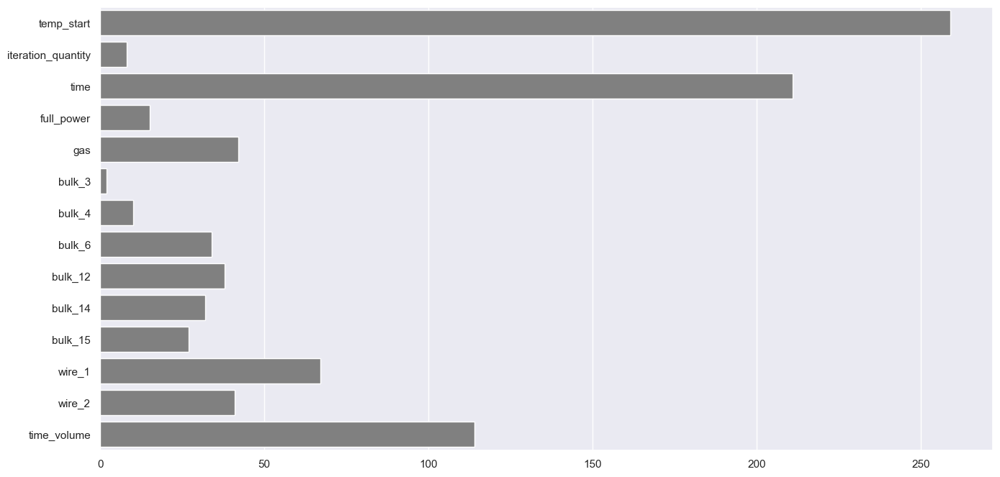

In [36]:
importances = grid_lgbm.best_estimator_.feature_importances_
feature_names = list(features_train.columns)
sns.barplot(x=importances, y=feature_names, color='Grey');

Наиболее значимыми при прогнозировании оказались признаки, характеризующие начальную температуру стали, а также время нагрева дугой. Наименьшее значение имеют переменные, характеризующие количество итераций, объем добавления сыпучих материалов, а также величину полной энергии.  

Дополнительным требованием заказчика был расчет коэффициента детерминации. 

In [37]:
print(f'R2 модели = {r2_score(target_test, predict_best):.4}')

R2 модели = 0.3667


Значение коэффициента детерминации меньше единицы можем интерпретировать как наличие в модели пропущенных переменных. Следует проработать вопрос включения дополнительных переменных для потенциального улучшения прогнозной силы модели.  

# Вывод

Чтобы оптимизировать производственные расходы, к нам обратился металлургический комбинат ООО «Так закаляем сталь». Нашей задачей было построение модели, которая предскажет температуру стали по итогам процесса обработки. Заказчик передал нам информацию о замерах температуры, затраченной энергии, газа, объеме и времени добавления сыпучих и проволочных материалов. В процессе исследовательского анализа данных мы уточнили интересующую нас недостающую информацию и согласовали с заказчиком способы устранения пропущенных и аномальных значений. 

На этапе предварительной обрабокти данных мы выявили и исключили переменные, содержащие более 85% пропущенных значений, обработали выбросы, сгенерировали несколько переменных с целью улучшения качества потенциальных моделей. Обнаружив высокую корреляцию между несколькими признаками, мы не стали их удалять, так как использование моделей линейной регрессии не планировалось (остальные модели могут справиться с возможной мультиколлинеарностью). Показатели активной и реактивной мощностей заменили на полную мощность.

Для тестирования мы выбрали следующие модели:
 - `RandomForestRegressor`;
 - `LightGBMRegressor`;
 - `CatBoostRegressor`.

На тренировочной выборке лучшей, исходя из заявленной заказчиком метрики качества, оказалась модель бустинга LGBM с гиперпараметрами {'learning_rate': 0.05, 'max_depth': 7, 'num_leaves': 10, 'reg_alpha': 0.9}, MAE составило 5.883. Наиболее значимыми при прогнозировании оказались признаки, характеризующие начальную температуру стали, а также время нагрева дугой. Наименьшее значение имеют переменные, характеризующие количество итераций, объем добавления сыпучих материалов, а также величину полной энергии.

При тестировании модели на тестовой выборке значение целевой метрики составило 6.395, что соответствует требованиям заказчика. 

Дополнительным требованием был расчет коэффициента детерминации, который оказался равен 0.3667. Значение коэффициента детерминации меньше единицы можем интерпретировать как наличие в модели пропущенных переменных. Дополнительная информация о химическом составе обрабатываемой стали может существенно улучшить прогнозную силу модели. Кроме этого, увеличение количества наблюдений позволит добавить переменные, удаленные из-за большой доли пропущенных значений, что также может положительно сказаться на качестве модели.

# Отчет

## Сравнение решения и плана

Для решения поставленной задачи по итогам исследовательского анализа данных был составлен следующий план:

1) проведение предварительной обработки данных.

2) формирование целевой и объясняющих переменных. 

3) анализ качества выбранных моделей.

4) тестирование лучшей модель. Определим, достигнуто ли пороговое значение целевой метрики.

5) анализ полученных результатов.

6) подготовка отчета для заказчика.

В рамках решения поставленной задачи мы выполнили все пункты составленного плана.

## Описание трудностей проекта

При реализации проекта были обнаружены следующие трудности:

1) Незнание процесса обработки стали. Для устранения пробела в знаниях воспользовались открытыми источниками информации и  обратились к заказчику с уточняющими вопросами.

2) Предварительная обработка данных без консультаций с заказчиком могла вызвать трудности. Комментарии заказчика помогли заполнить пропущенные значения достоверными данными, а также идентифицировать аномалии и удалить их. 

3) Неполнота данных и выбросы. Консультации с заказчиком помогли определить информативность некоторых признаков, принять верное решение относительно выбросов. 

4) Наличие промущенных переменных. Генерация новых переменных заняла значительную часть времени. Консультация с заказчиком и тимлидом помогла определить направление исследования. 

5) Определение значимости переменных для прогнозирования. Подбор значимых переменных для моделирования потребовал определенных временных ресурсов. 

## Ключевые шаги решения

Ключевыми можем считать шаги, соответствующие плану, иных шагов нет. 

## Использованные признаки

При решении поставленной задачи для моделирования мы использовали следующие переменные:
1) **temp_start**. Начальная температура стали, полученная агрегированием данных из таблицы `data_temp_new.csv`. Мы взяли температуру первого замера для каждой партии. 

2) **iteration_quantity**. Количество итераций нагрева дугой.  Данные получены из таблицы `data_temp_new.csv`. Для каждой партии посчитано количество замеров температуры стали, из полученного значения отняли единицу (первый замер, предшествующий обработке). 

3) **time**. Суммарное время нагрева дугой в рамках одной партии. Данные получены из таблицы `data_arc_new.csv`. Посчитано время замера на каждой итерации внутри партии, после чего полученные значения просуммировались. 

4) **full_power**. Полная мощность. Данные получены из таблицы `data_arc_new.csv`. Для каждой партии была найдена суммарная активная и реактивная мощности, после чего посчитана полная мощность (корень квадратный из суммы квадратов активной и реактивной мощностей). 

5) **gas**. Данные о продувке сплава газом из таблицы `data_gas_new.csv`.

6) **bulk_3**. Данные о добавлении сыпучих материалов из таблицы `data_bulk_new.csv`. Пропущенные значения были заполнены нулями. Выбросы не удаляли, так как большой объем добавления материала в сплав может соответствовать производственному процессу.

7) **bulk_4**. Данные о добавлении сыпучих материалов из таблицы `data_bulk_new.csv`. Пропущенные значения были заполнены нулями. Выбросы не удаляли, так как большой объем добавления материала в сплав может соответствовать производственному процессу.

8) **bulk_6**. Данные о добавлении сыпучих материалов из таблицы `data_bulk_new.csv`. Пропущенные значения были заполнены нулями. Выбросы не удаляли, так как большой объем добавления материала в сплав может соответствовать производственному процессу.

9) **bulk_12**. Данные о добавлении сыпучих материалов из таблицы `data_bulk_new.csv`. Пропущенные значения были заполнены нулями. Выбросы не удаляли, так как большой объем добавления материала в сплав может соответствовать производственному процессу.

10) **bulk_14**. Данные о добавлении сыпучих материалов из таблицы `data_bulk_new.csv`. Пропущенные значения были заполнены нулями. Выбросы не удаляли, так как большой объем добавления материала в сплав может соответствовать производственному процессу.

11) **bulk_15**. Данные о добавлении сыпучих материалов из таблицы `data_bulk_new.csv`. Пропущенные значения были заполнены нулями. Выбросы не удаляли, так как большой объем добавления материала в сплав может соответствовать производственному процессу.

12) **wire_1**. Данные о добавлении сыпучих материалов из таблицы `data_wire_new.csv`. Пропущенные значения были заполнены нулями. Выбросы не удаляли, так как большой объем добавления материала в сплав может соответствовать производственному процессу.

13) **wire_2**. Данные о добавлении сыпучих материалов из таблицы `data_wire_new.csv`. Пропущенные значения были заполнены нулями. Выбросы не удаляли, так как большой объем добавления материала в сплав может соответствовать производственному процессу.

14) **time_volume**. Суммарное время между замерами температуры в рамках одной партии. Данные получены из таблицы `data_temp_new.csv`. Посчитано время замера на каждой итерации внутри партии, после чего полученные значения просуммировались. 

## Итоговая модель

На тренировочной выборке лучшей, исходя из заявленной заказчиком метрики качества, оказалась модель бустинга **`LGBM (LGBMRegressor)`** с гиперпараметрами **`{'learning_rate': 0.05, 'max_depth': 7, 'num_leaves': 10, 'reg_alpha': 0.9}`**, **`random_state = 280823`**, MAE составило **`5.883`**. При тестировании модели на тестовой выборке значение целевой метрики составило **`6.395`**, что соответствует условиям поставленной задачи. 

Дополнительным требованием был расчет **`коэффициента детерминации`**, который оказался равен **`0.3667`**. 